In [10]:
import tensorflow as tf

from tl_classifier import TLClassifier

#### Load the inference graph

In [11]:
pb_graph_file = 'retrained_SSD/frozen_inference_graph.pb'

graph = tf.Graph()
with graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(pb_graph_file, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

#### Load the images

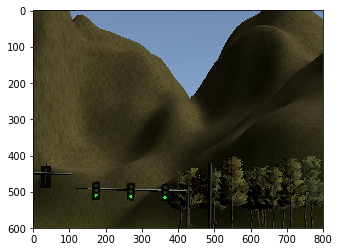

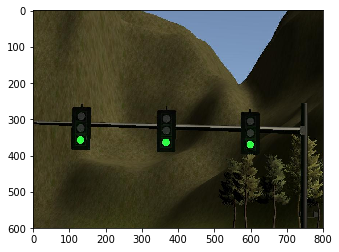

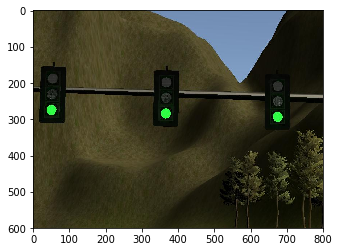

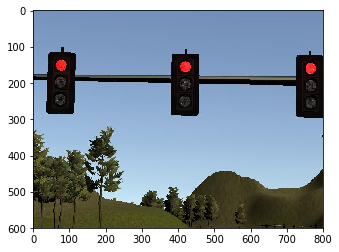

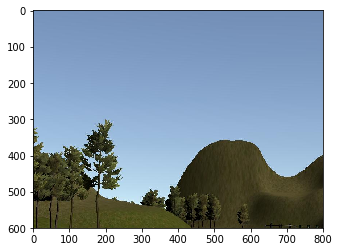

...

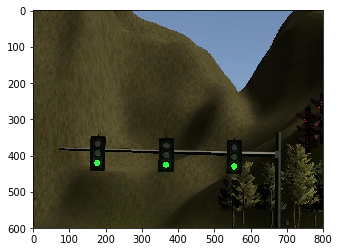

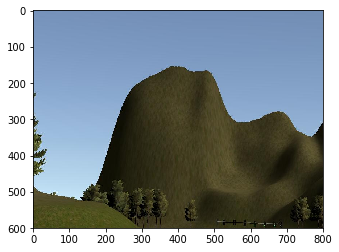

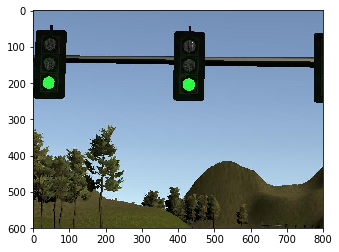

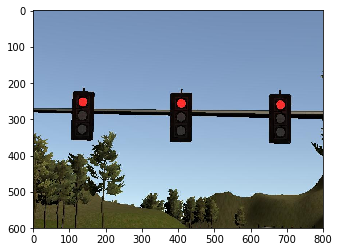

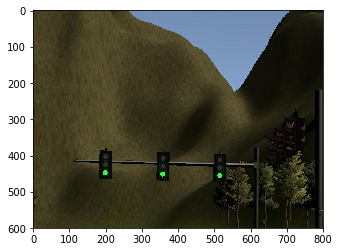

In [24]:
from glob import glob
import matplotlib.pyplot as plt
%matplotlib inline
import cv2


image_paths = 'sim_images/*'

images = []
for img_path in glob(image_paths):
    img = cv2.imread(img_path)
    img = img[...,::-1] # BGR to RGB
    images.append(img)
    plt.imshow(img)
    plt.show()

#### Run inference

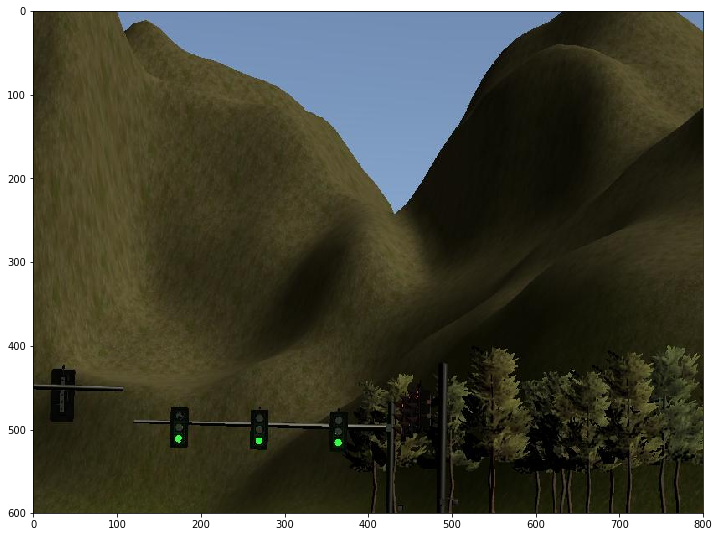

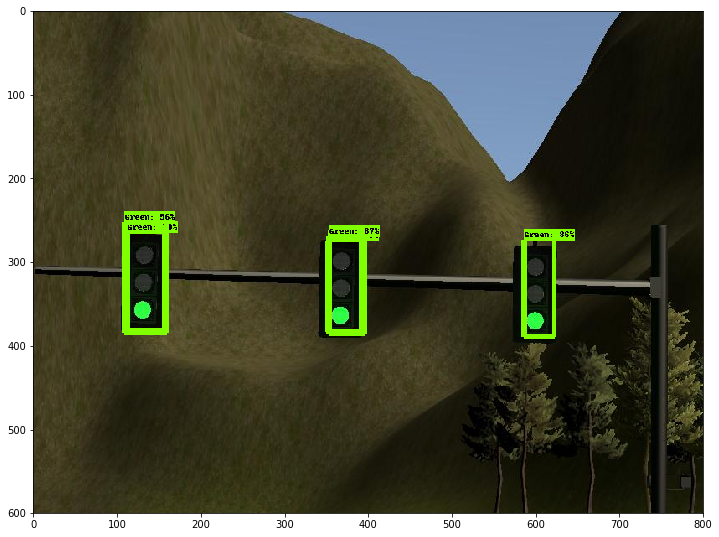

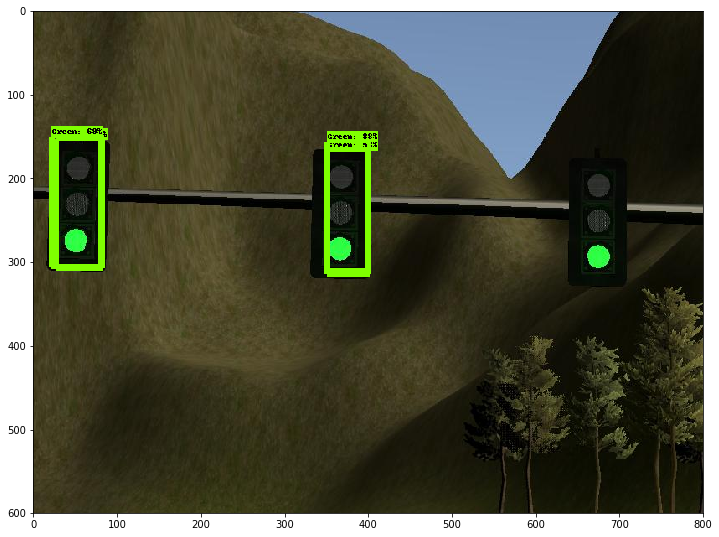

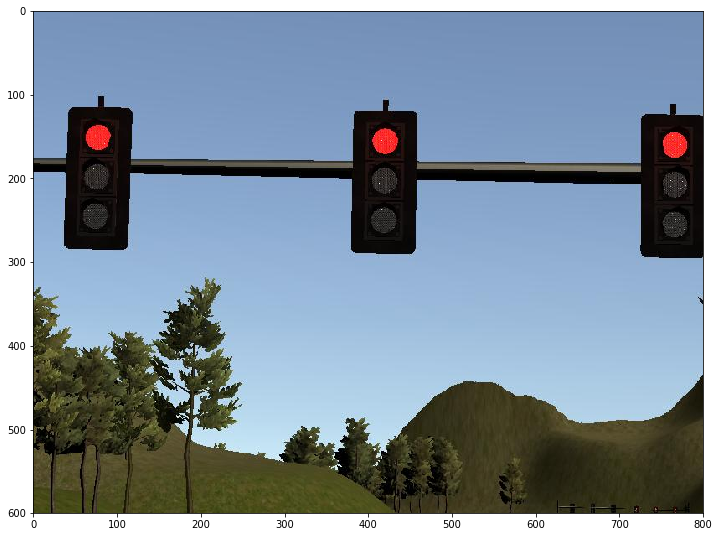

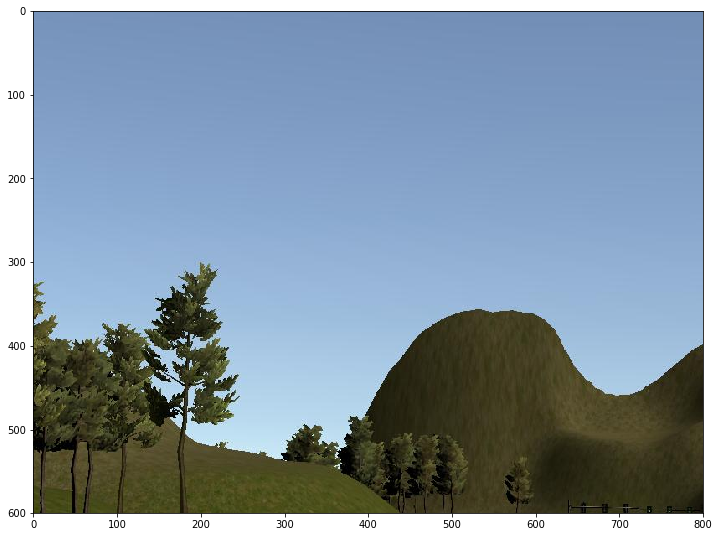

...

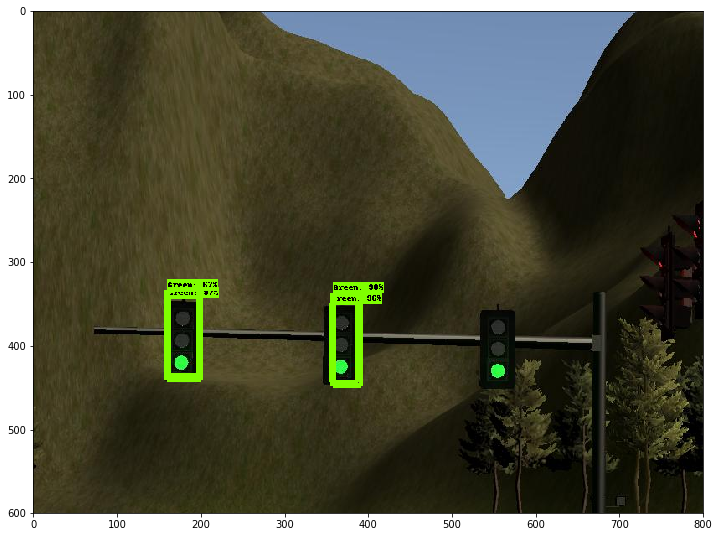

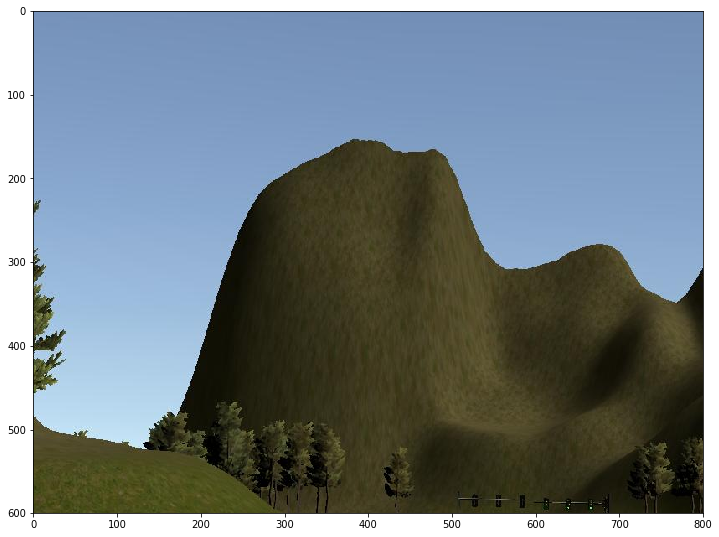

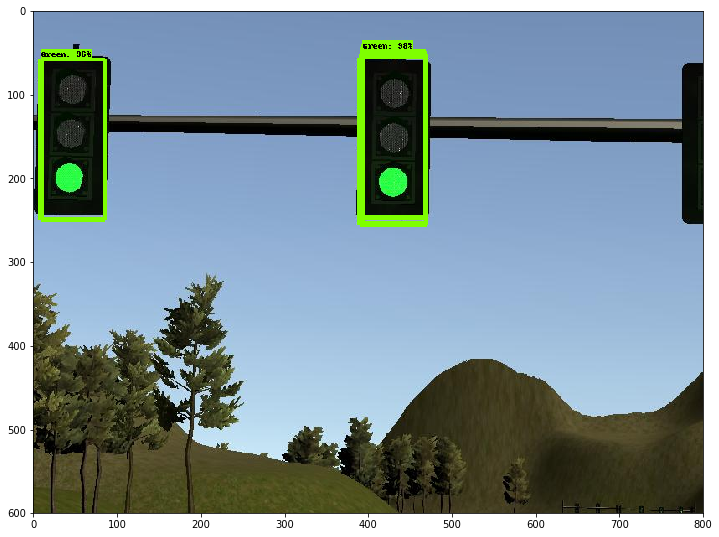

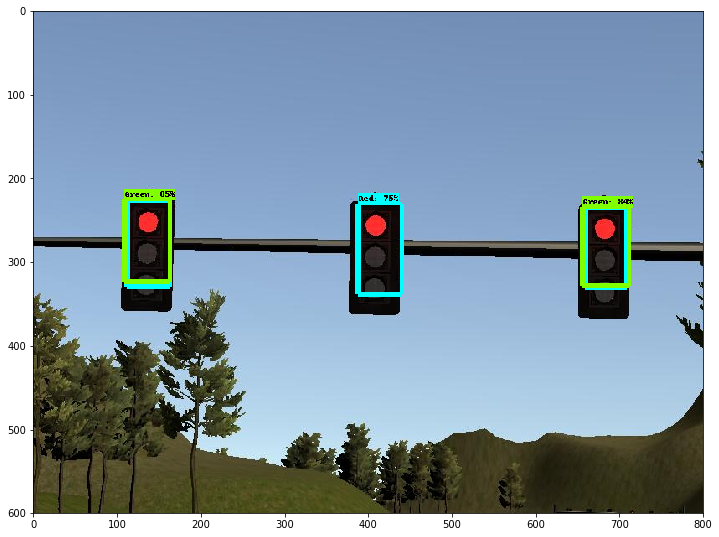

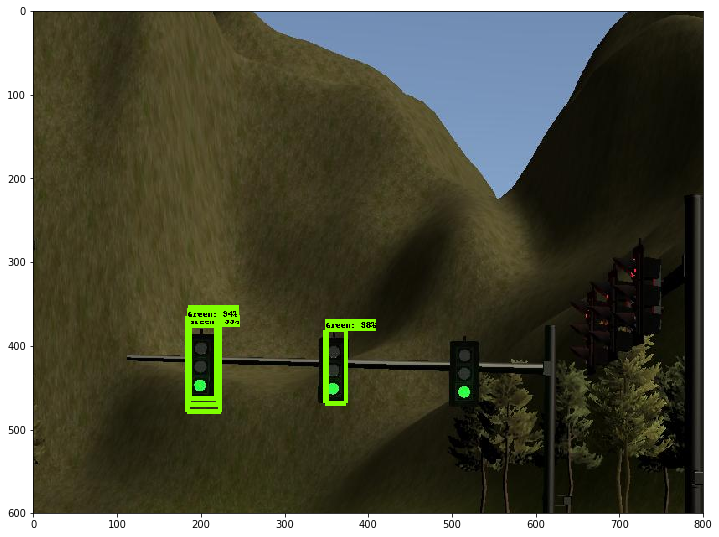

In [27]:
import numpy as np
from utils import visualization_utils as vis_util


category_index = {
    1: {'id': 1, 'name': 'Green'},
    2: {'id': 2, 'name': 'Red'},
    3: {'id': 3, 'name': 'Yellow'},
    4: {'id': 4, 'name': 'off'}
}


with graph.as_default():
    with tf.Session(graph=graph) as sess:
        image_ = graph.get_tensor_by_name('image_tensor:0')
        boxes_ = graph.get_tensor_by_name('detection_boxes:0')
        scores_ = graph.get_tensor_by_name('detection_scores:0')
        classes_ = graph.get_tensor_by_name('detection_classes:0')
        num_ = graph.get_tensor_by_name('num_detections:0')
        
        for img in images:
            (boxes, scores, classes, num) = sess.run([boxes_, scores_, classes_, num_], {
                image_: [img]
            })
             
            vis_util.visualize_boxes_and_labels_on_image_array(
                img, 
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=1,
                line_thickness=5
            )
            plt.figure(figsize=(12, 12))
            plt.imshow(img)
            plt.show()